<a href="https://colab.research.google.com/github/ShyamSundhar1411/My-ML-Notebooks/blob/master/Computer%20Vision/Cascade_Classifier_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Introduction to Face Detection Using OpenCV

### 1. Importing Data

In [127]:
import cv2

In [128]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [129]:
image = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg")

In [130]:
image

array([[[ 91, 103, 107],
        [102, 114, 118],
        [ 92, 107, 110],
        ...,
        [187, 192, 193],
        [186, 191, 192],
        [185, 190, 191]],

       [[ 93, 105, 109],
        [ 97, 109, 113],
        [ 95, 110, 113],
        ...,
        [187, 192, 193],
        [186, 191, 192],
        [185, 190, 191]],

       [[ 96, 111, 114],
        [ 96, 111, 114],
        [102, 117, 120],
        ...,
        [186, 191, 192],
        [185, 190, 191],
        [184, 189, 190]],

       ...,

       [[ 48,  43,  40],
        [ 46,  41,  38],
        [ 44,  39,  36],
        ...,
        [251, 248, 244],
        [252, 247, 244],
        [251, 246, 243]],

       [[ 55,  49,  44],
        [ 53,  47,  42],
        [ 49,  43,  38],
        ...,
        [251, 248, 244],
        [252, 247, 244],
        [252, 247, 244]],

       [[ 56,  50,  45],
        [ 54,  48,  43],
        [ 50,  44,  39],
        ...,
        [252, 249, 245],
        [253, 248, 245],
        [253, 248, 245]]

In [131]:
image.shape

(1280, 1920, 3)

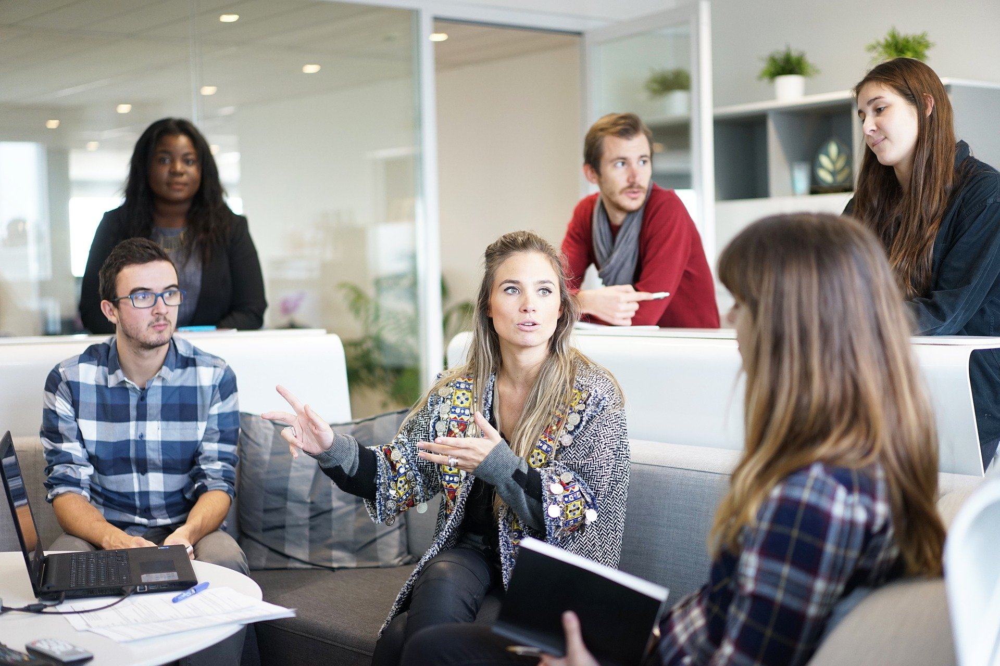

In [132]:
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [133]:
# image = cv2.resize(image,(800,500))

In [134]:
image.shape

(1280, 1920, 3)

In [135]:
image_grey = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

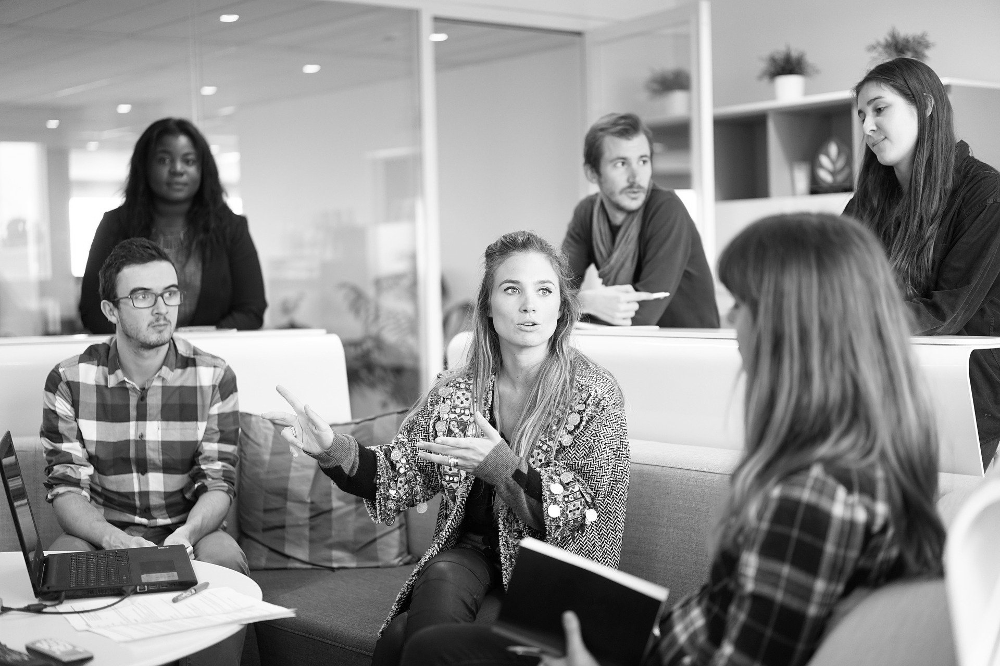

In [136]:
cv2_imshow(image_grey)

### 2. Detecting Faces

In [137]:
face_detector = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml")

In [138]:
face_detector

< cv2.CascadeClassifier 0x7f5b2a3a03b0>

In [139]:
detections = face_detector.detectMultiScale(image_grey,scaleFactor = 1.3,minSize = (30,30))

In [140]:
detections

array([[1635,  156,  147,  147],
       [ 284,  262,  114,  114],
       [1149,  260,  129,  129],
       [ 928,  491,  171,  171],
       [ 222,  507,  151,  151]], dtype=int32)

In [141]:
len(detections)

5

1635 156 147 147
284 262 114 114
1149 260 129 129
928 491 171 171
222 507 151 151


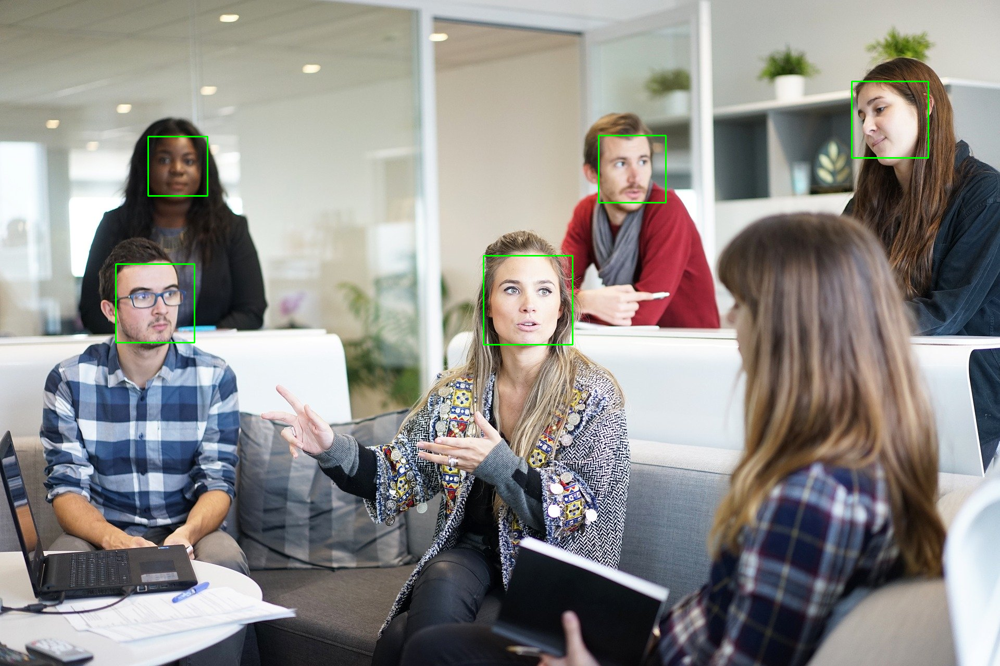

In [142]:
for(x,y,w,h) in detections:
  print(x,y,w,h)
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image)

### 3. Haarcascade Parameters

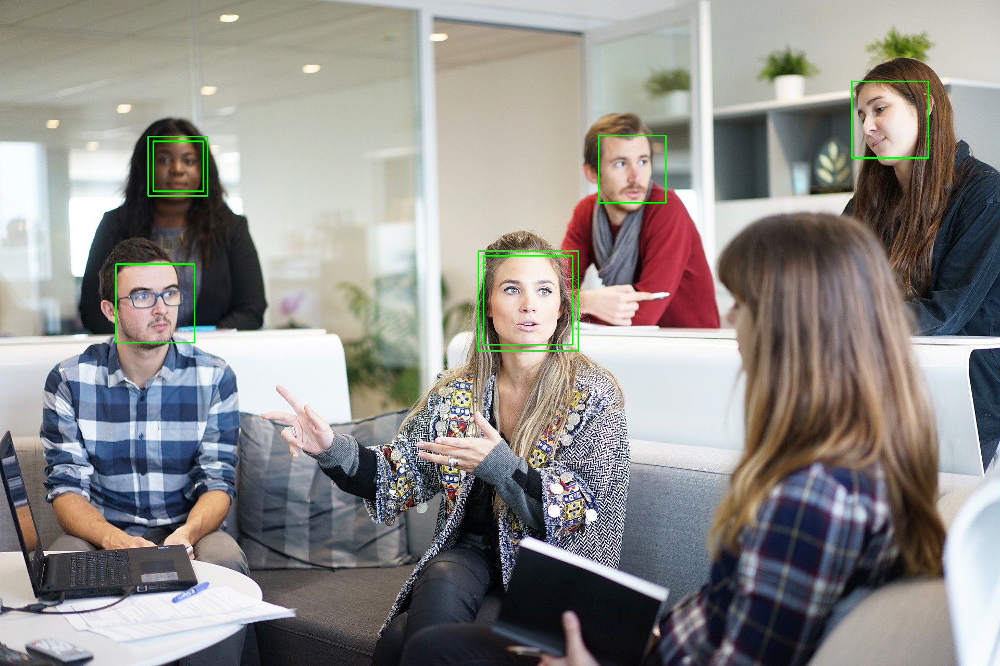

In [143]:
face_detector_2 = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml")
detections = face_detector_2.detectMultiScale(image_grey,scaleFactor = 2,minNeighbors =5)
for(x,y,w,h) in detections:
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image)

In [144]:
image_2 = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg")

In [145]:
image_2

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [146]:
image_2_gray = cv2.cvtColor(image_2,cv2.COLOR_BGR2GRAY)

In [147]:
detections = face_detector_2.detectMultiScale(image_2_gray,scaleFactor = 1.05,minNeighbors = 8)

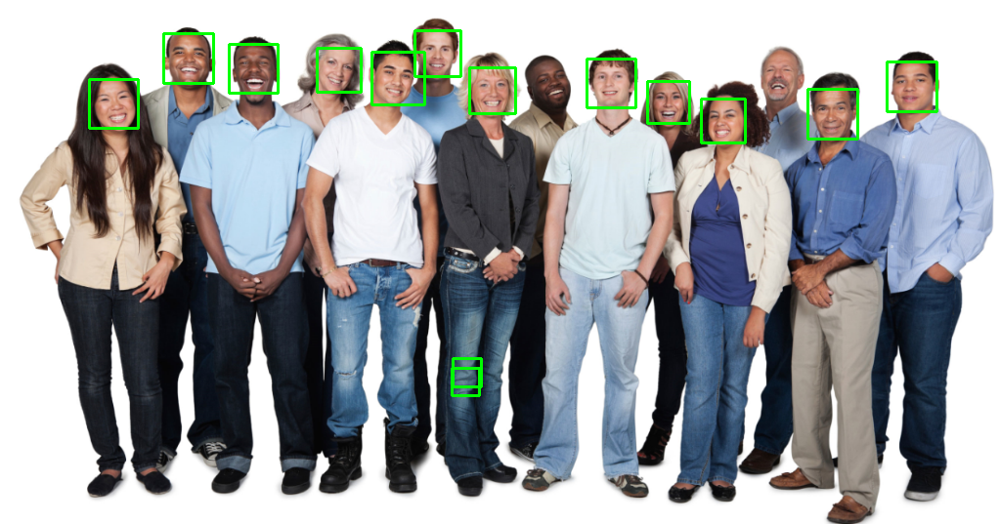

In [148]:
for (x,y,w,h) in detections:
  cv2.rectangle(image_2,(x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image_2)

### 4. Eye Detection 

In [149]:
eye_detector = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_eye.xml")

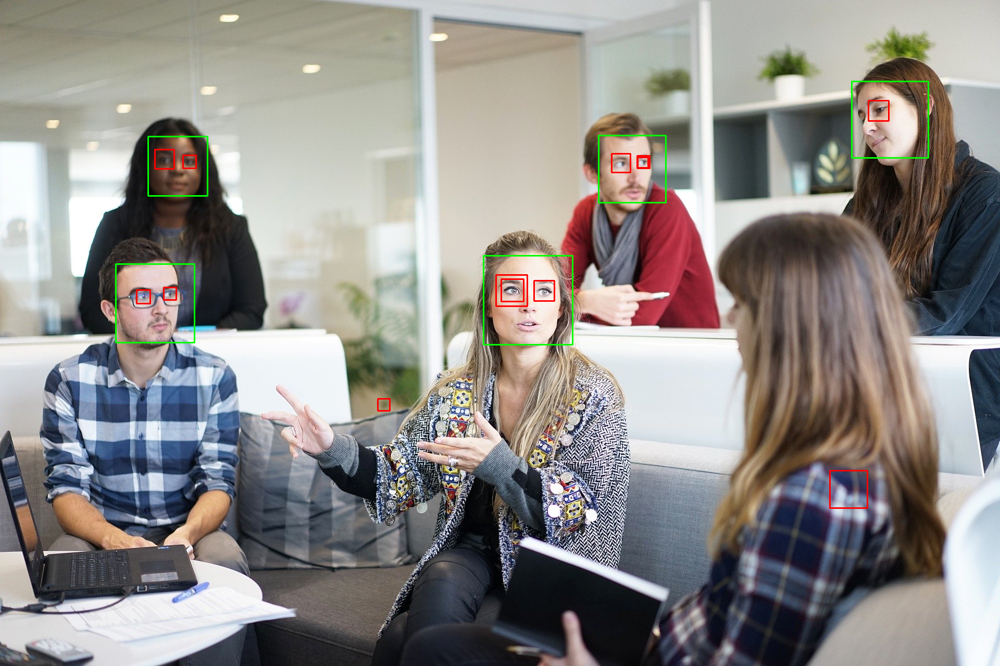

In [126]:
eye_detections = eye_detector.detectMultiScale(image_grey,scaleFactor = 1.1,minNeighbors = 10,maxSize = (78,78))
for(x,y,w,h) in eye_detections:
  cv2.rectangle(image,(x,y),(x+w,y+h),(0,0,255),2)
cv2_imshow(image)

### 5. Car Detection

In [222]:
def detection_visualizer(detections,image):
  for (x,y,w,h) in detections:
    print(w,h)
    cv2.rectangle(image,(x,y),(x+w,y+h),(0,255,0),2)
  cv2_imshow(image)

In [228]:
car_detector = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass/Cascades/cars.xml")
image_3 = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass/Images/car.jpg")
image_3_gray = cv2.cvtColor(image_3,cv2.COLOR_BGR2GRAY)
car_detections = car_detector.detectMultiScale(image_3_gray,scaleFactor=1.03,minNeighbors = 2)

32 32
47 47
76 76
35 35
38 38
46 46
54 54
46 46
81 81
28 28
40 40
32 32
53 53
84 84


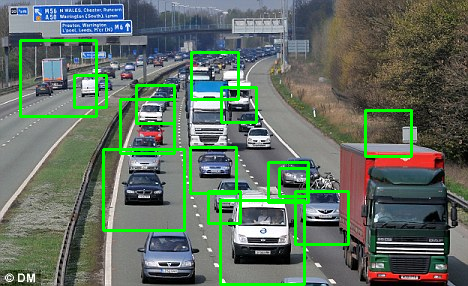

In [229]:
for (x,y,w,h) in car_detections:
  print(w,h)
  cv2.rectangle(image_3,(x,y),(x+w,y+h),(0,255,0),2)
cv2_imshow(image_3)

### 6. Clock Detection

99 99
99 99
114 114
88 88
64 64
94 94
99 99


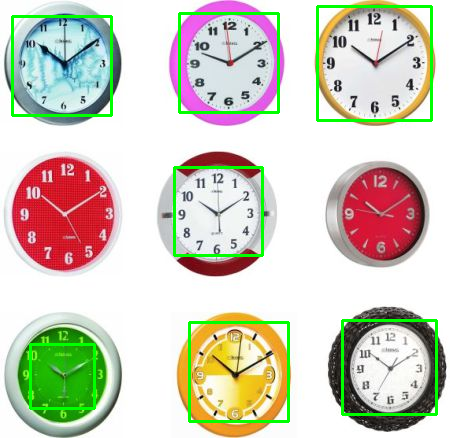

In [232]:
clock_detector = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass/Cascades/clocks.xml")
image_4 = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass/Images/clock.jpg")
image_4_gray = cv2.cvtColor(image_4,cv2.COLOR_BGR2GRAY)
clock_detections = clock_detector.detectMultiScale(image_4_gray,minNeighbors = 1)
detection_visualizer(clock_detections,image_4)

### 7. FullBody Detector

89 177
85 170
93 185
78 157
73 146
83 166
66 132
88 177


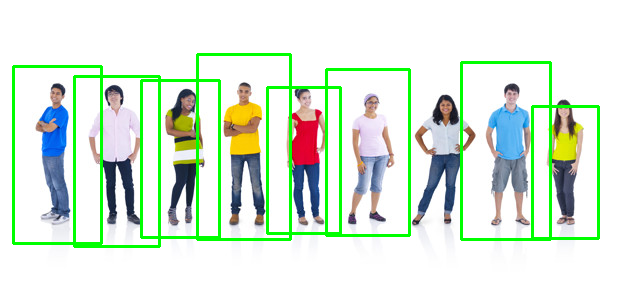

In [243]:
full_body_detector = cv2.CascadeClassifier("/content/drive/MyDrive/Computer Vision Masterclass/Cascades/fullbody.xml")
image_5 = cv2.imread("/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg")
image_5_gray = cv2.cvtColor(image_5,cv2.COLOR_BGR2GRAY)
full_body_detections = full_body_detector.detectMultiScale(image_5,scaleFactor = 1.03,minNeighbors = 5,minSize = (50,50))
detection_visualizer(full_body_detections,image_5)